## Cloth Mask
> 切换Conda环境到 hr_viton
```
cd /data/aigc
conda env list
conda activate hr_viton 
jupyter notebook --ip 0.0.0.0  --allow-root
```
> 前面生成的素材：http://18.235.18.147:8888/notebooks/package/hr_viton_packages.ipynb

In [1]:
!pip install carvekit_colab

In [2]:
## 下载模型
from carvekit.ml.files.models_loc import download_all
download_all();
# /root/.cache/carvekit/checkpoints/
# u2net.pth fba_matting.pth deeplab.pth basnet.pth tracer_b7.pth

/data/miniconda3/envs/hr_viton/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [8]:
clothing_image = "t2.jpg"
cloth_dir = '/data/aigc/HR-VITON/data_new/cloths'
cloth_mask_dir = '/data/aigc/HR-VITON/data_new/cloth-mask'
cloth_data_dir = '/data/aigc/HR-VITON/data_new/test/cloth'
cloth_mask_data_dir = '/data/aigc/HR-VITON/data_new/test/cloth-mask'

In [2]:
# !mkdir ./cloth
# !mkdir ./cloth_mask

# !cp ./data/test_b/cloth/00008_00.jpg $cloth_dir

SHOW_FULLSIZE: False
idx: 0


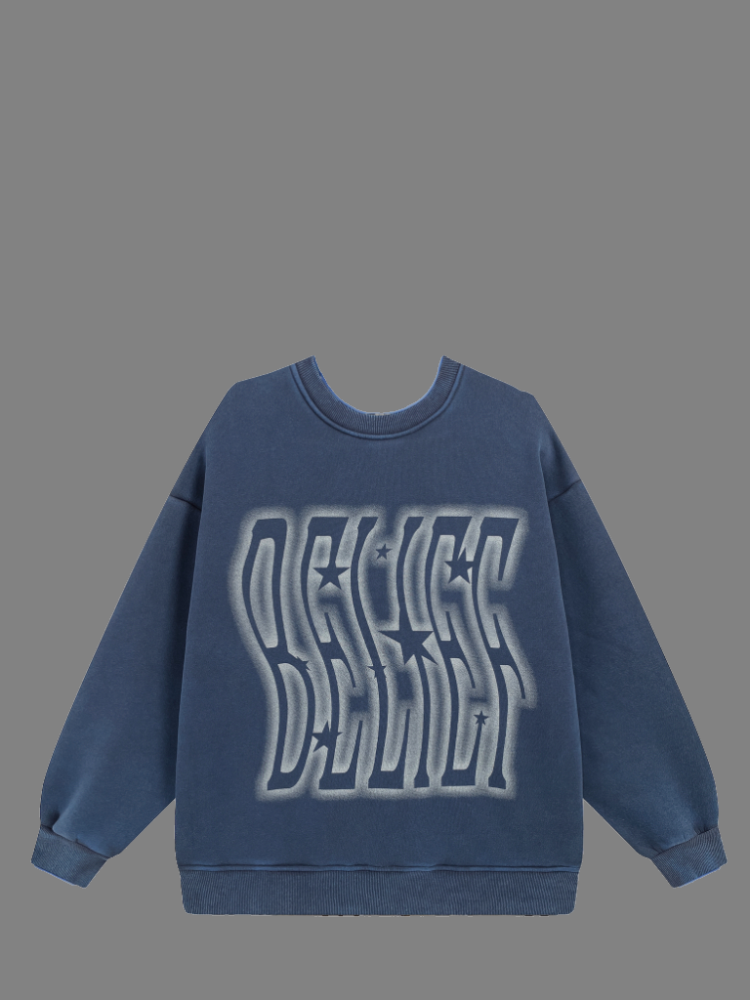

In [5]:
#title Upload images from your computer
#markdown Description of parameters
#markdown - `SHOW_FULLSIZE`  - Shows image in full size (may take a long time to load)
#markdown - `PREPROCESSING_METHOD`  - Preprocessing method
#markdown - `SEGMENTATION_NETWORK`  - Segmentation network. Use `u2net` for hairs-like objects and `tracer_b7` for objects
#markdown - `POSTPROCESSING_METHOD`  - Postprocessing method
#markdown - `SEGMENTATION_MASK_SIZE` - Segmentation mask size. Use 640 for Tracer B7 and 320 for U2Net
#markdown - `TRIMAP_DILATION`  - The size of the offset radius from the object mask in pixels when forming an unknown area
#markdown - `TRIMAP_EROSION`  - The number of iterations of erosion that the object's mask will be subjected to before forming an unknown area
### https://pypi.org/project/carvekit/
import torch
from IPython import display
import os
import numpy as np
from PIL import Image, ImageOps
from carvekit.web.schemas.config import MLConfig
from carvekit.web.utils.init_utils import init_interface
from PIL import Image
import cv2
import os
import numpy as np

# 文件名统一改为jpg
for name in os.listdir(cloth_dir):
    if name.endswith('.png') or name.endswith('.jpeg'):
        os.rename(os.path.join(cloth_dir, name), os.path.join(cloth_dir, name[:-4] + '.jpg'))

SHOW_FULLSIZE = False #param {type:"boolean"}
PREPROCESSING_METHOD = "none" #param ["stub", "none"]
SEGMENTATION_NETWORK = "tracer_b7" #param ["u2net", "deeplabv3", "basnet", "tracer_b7"]
POSTPROCESSING_METHOD = "fba" #param ["fba", "none"] 
SEGMENTATION_MASK_SIZE = 640 #param ["640", "320"] {type:"raw", allow-input: true}
TRIMAP_DILATION = 30 #param {type:"integer"}
TRIMAP_EROSION = 100 #param {type:"integer"}
# DEVICE = 'cpu' # 'cuda'
# DEVICE = 'cuda' # 'cuda'
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

config = MLConfig(segmentation_network=SEGMENTATION_NETWORK,
                  preprocessing_method=PREPROCESSING_METHOD,
                  postprocessing_method=POSTPROCESSING_METHOD,
                  seg_mask_size=SEGMENTATION_MASK_SIZE,
                  trimap_dilation=TRIMAP_DILATION,
                  trimap_erosion=TRIMAP_EROSION,
                  device=DEVICE)

interface = init_interface(config)

imgs = []
root = cloth_dir
for name in os.listdir(root):
    imgs.append(root + '/' + name)

images = interface(imgs)
for i, im in enumerate(images):
    img = np.array(im)
    img = img[...,:130] # no transparency
    idx = (img[...,3]==0) # background 0 or 130, just try it
    img = np.ones(idx.shape)*255
    img[idx] = 0
    im = Image.fromarray(np.uint8(img), 'L')
    im.save(f'{cloth_mask_dir}/{imgs[i].split("/")[-1].split(".")[0]}.jpg')

for idx, im in enumerate(images):
    print("SHOW_FULLSIZE:", SHOW_FULLSIZE)
    if not SHOW_FULLSIZE:
        print("idx:", idx)
        
        if idx==0:
            i_image = np.array(im)
            i_image = cv2.cvtColor(i_image, cv2.COLOR_BGR2RGB)
            res = i_image
        else:
            i_image = np.array(im)
            i_image = cv2.cvtColor(i_image, cv2.COLOR_BGR2RGB)
            res = np.concatenate([res, i_image], axis=1)
resr = Image.fromarray(res)
resr

#         display.display(im[1])

['/data/aigc/HR-VITON/data_new/cloths/t2.jpg']
['/data/aigc/HR-VITON/data_new/cloth-mask/t2.jpg']


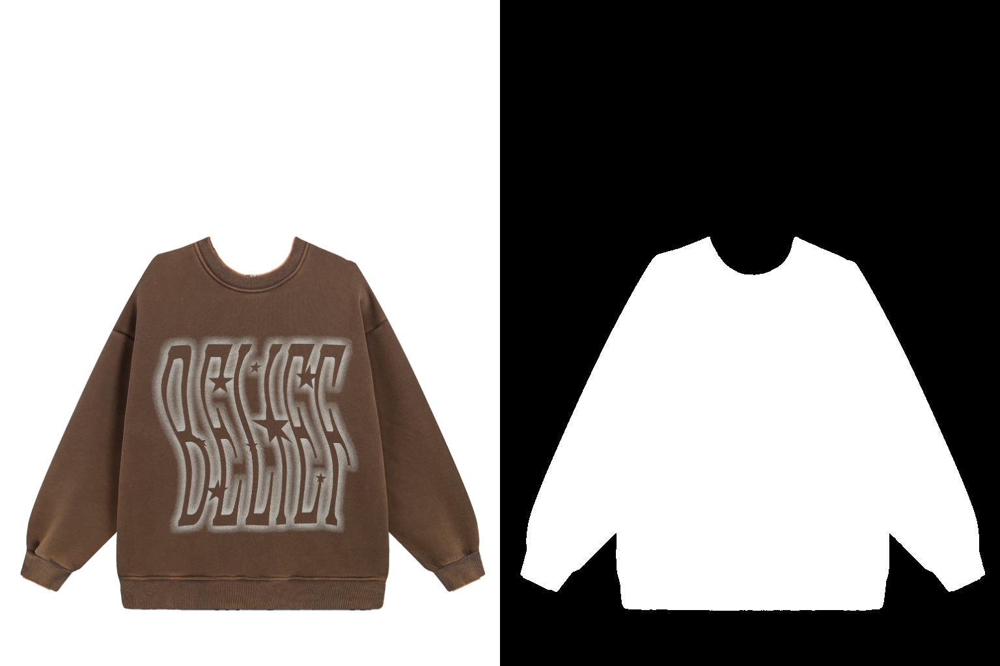

In [6]:

## 查看推理结果

from PIL import Image
import cv2
import os
import numpy as np

images = [os.path.join(f"{cloth_dir}", x) for x in os.listdir(f"{cloth_dir}")]
inputs = images
print(inputs)

output = [os.path.join(f"{cloth_mask_dir}", x) for x in os.listdir(f"{cloth_mask_dir}")]
sample_images = output
print(sample_images)
for idx, image_path in enumerate(sample_images):
    if idx == len(inputs):
        break
    if idx == 0:
        i_image = cv2.imread(inputs[idx])
        i_image = cv2.cvtColor(i_image, cv2.COLOR_BGR2RGB)
        res = i_image
    else:
        i_image = cv2.imread(inputs[idx])
        i_image = cv2.cvtColor(i_image, cv2.COLOR_BGR2RGB)
        res = np.concatenate([res, i_image], axis=1)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    res = np.concatenate([res, image], axis=1)
resr = Image.fromarray(res)
resr

In [7]:
cp_cloth_dir = f"{cloth_dir}/*"
cp_cloth_mask_dir = f"{cloth_mask_dir}/*"
print(cp_cloth_dir, cp_cloth_mask_dir)
print(cloth_data_dir, cloth_mask_data_dir)

!cp -r $cp_cloth_dir $cloth_data_dir
!cp -r $cp_cloth_mask_dir $cloth_mask_data_dir
# !rm -rf $cp_cloth_dir
# !rm -rf $cp_cloth_mask_dir

# cp_cloth_data_dir = f"{$cloth_data_dir}/"
# !cp -r $cp_cloth_dir $cloth_data_dir

# cloth_dir = '/data/aigc/HR-VITON/data_new/cloths'
# cloth_mask_dir = '/data/aigc/HR-VITON/data_new/cloth-mask'
# cloth_data_dir = '/data/aigc/HR-VITON/data_new/test/cloth'
# cloth_mask_data_dir = '/data/aigc/HR-VITON/data_new/test/cloth-mask'

inference_txt = '/data/aigc/HR-VITON/data_new/test_pairs.txt'
with open(inference_txt, 'r') as f:
    content = f.read()
    print(content)

/data/aigc/HR-VITON/data_new/cloths/* /data/aigc/HR-VITON/data_new/cloth-mask/*
/data/aigc/HR-VITON/data_new/test/cloth /data/aigc/HR-VITON/data_new/test/cloth-mask
05006_00.jpg t1.jpg
02532_00.jpg t1.jpg
03921_00.jpg t1.jpg
12419_00.jpg t1.jpg
12562_00.jpg t1.jpg
08650_00.jpg t1.jpg
08088_00.jpg t1.jpg
03191_00.jpg t1.jpg
08839_00.jpg t1.jpg
02944_00.jpg t1.jpg



In [9]:
# all_files = f'{cloth_mask_dir}/*'
# !rm -rf $all_files
test_pairs = f'''05006_00.jpg {clothing_image}
02532_00.jpg {clothing_image}
03921_00.jpg {clothing_image}
12419_00.jpg {clothing_image}
12562_00.jpg {clothing_image}
08650_00.jpg {clothing_image}
08088_00.jpg {clothing_image}
03191_00.jpg {clothing_image}
08839_00.jpg {clothing_image}
02944_00.jpg {clothing_image}
'''
with open(inference_txt, 'w') as f:
    content = f.write(test_pairs)
    print(content)
with open(inference_txt, 'r') as f:
    content = f.read()
    print(content)

200
05006_00.jpg t2.jpg
02532_00.jpg t2.jpg
03921_00.jpg t2.jpg
12419_00.jpg t2.jpg
12562_00.jpg t2.jpg
08650_00.jpg t2.jpg
08088_00.jpg t2.jpg
03191_00.jpg t2.jpg
08839_00.jpg t2.jpg
02944_00.jpg t2.jpg



Namespace(gpu_ids='0', workers=4, batch_size=1, fp16=True, cuda='True', test_name='t7', dataroot='/data/aigc/HR-VITON/data_new', datamode='test', data_list='test_pairs.txt', output_dir='/data/aigc/HR-VITON/Output/t7', datasetting='unpaired', fine_width=768, fine_height=1024, tensorboard_dir='./data/zalando-hd-resize/tensorboard', checkpoint_dir='checkpoints', tocg_checkpoint='./eval_models/weights/v0.1/mtviton.pth', gen_checkpoint='./eval_models/weights/v0.1/gen.pth', tensorboard_count=100, shuffle=False, semantic_nc=13, output_nc=13, gen_semantic_nc=7, warp_feature='T1', out_layer='relu', clothmask_composition='warp_grad', upsample='bilinear', occlusion=True, norm_G='spectralaliasinstance', ngf=64, init_type='xavier', init_variance=0.02, num_upsampling_layers='most')
Start to test %s!
/data/miniconda3/envs/hr_viton/lib/python3.10/site-packages/torchvision/transforms/transforms.py:329: UserWarning: Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.1

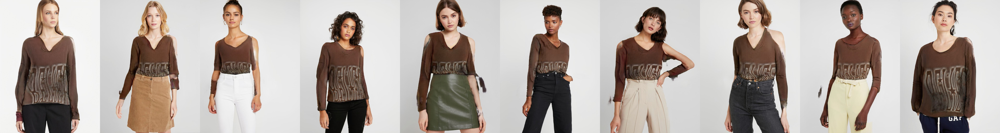

In [10]:
test_name = "t7"
output_path = f"/data/aigc/HR-VITON/Output/{test_name}"
if not os.path.exists(output_path):
    os.mkdir(output_path)

### 推理-穿衣服2

script = f'''python /data/aigc/HR-VITON/test_generator.py \
    --occlusion --cuda True --test_name {test_name} --gpu_ids 0 --dataroot /data/aigc/HR-VITON/data_new \
    --num_upsampling_layers most \
    --fp16 \
    --output_dir {output_path} \
    --occlusion \
    --datasetting unpaired
'''
!$script
# !python test_generator.py \
#     --occlusion --cuda True --test_name t4 --gpu_ids 0 --dataroot ./data_new \
#     --num_upsampling_layers most \
#     --fp16 \
#     --output_dir /data/aigc/HR-VITON/Output/t4

## 查看推理结果

from PIL import Image
import cv2
import os
import numpy as np

outputs = [os.path.join(f"{output_path}", x) for x in os.listdir(f"{output_path}")]

for idx, image_path in enumerate(outputs):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    if idx == 0:
        res = image
    else:
        res = np.concatenate([res, image], axis=1)
resr = Image.fromarray(res)
resr

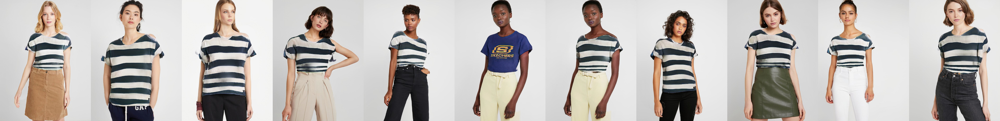

In [111]:
## 查看推理结果

from PIL import Image
import cv2
import os
import numpy as np

outputs = [os.path.join(f"{output_path}", x) for x in os.listdir(f"{output_path}")]

for idx, image_path in enumerate(outputs):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    if idx == 0:
        res = image
    else:
        res = np.concatenate([res, image], axis=1)
resr = Image.fromarray(res)
resr

## Parse Agnostic


In [35]:
!pip install Pillow tqdm

In [58]:
import json
from os import path as osp
import os
import numpy as np
from PIL import Image, ImageDraw
from tqdm import tqdm

def get_im_parse_agnostic(im_parse, pose_data, w=768, h=1024):
    label_array = np.array(im_parse)
    parse_upper = ((label_array == 5).astype(np.float32) +
                    (label_array == 6).astype(np.float32) +
                    (label_array == 7).astype(np.float32))
    parse_neck = (label_array == 10).astype(np.float32)

    r = 10
    agnostic = im_parse.copy()

    # mask arms
    for parse_id, pose_ids in [(14, [2, 5, 6, 7]), (15, [5, 2, 3, 4])]:
#         mask_arm = Image.new('L', (w, h), 'black')
        mask_arm = Image.new('L', (w, h), 'black').convert('L')
        mask_arm_draw = ImageDraw.Draw(mask_arm)
        i_prev = pose_ids[0]
        for i in pose_ids[1:]:
            if (pose_data[i_prev, 0] == 0.0 and pose_data[i_prev, 1] == 0.0) or (pose_data[i, 0] == 0.0 and pose_data[i, 1] == 0.0):
                continue
            mask_arm_draw.line([tuple(pose_data[j]) for j in [i_prev, i]], 'white', width=r*10)
            pointx, pointy = pose_data[i]
            radius = r*4 if i == pose_ids[-1] else r*15
            mask_arm_draw.ellipse((pointx-radius, pointy-radius, pointx+radius, pointy+radius), 'white', 'white')
            i_prev = i
        parse_arm = (np.array(mask_arm) / 255) * (label_array == parse_id).astype(np.float32)
#         parse_arm = (np.array(mask_arm) / 255) * (label_array == parse_id).astype(float)        
        agnostic.paste(0, None, Image.fromarray(np.uint8(parse_arm * 255), 'L'))

    # mask torso & neck
    agnostic.paste(0, None, Image.fromarray(np.uint8(parse_upper * 255), 'L'))
    agnostic.paste(0, None, Image.fromarray(np.uint8(parse_neck * 255), 'L'))

    return agnostic


if __name__ =="__main__":
    data_path = './data/test_new'
    output_path = './data/test_new/parse'
    
    os.makedirs(output_path, exist_ok=True)
    
    for im_name in tqdm(os.listdir(osp.join(data_path, 'image'))):
        
        # load pose image
        pose_name = im_name.replace('.jpg', '_keypoints.json')
        
        try:
            with open(osp.join(data_path, 'openpose_json', pose_name), 'r') as f:
                pose_label = json.load(f)
                pose_data = pose_label['people'][0]['pose_keypoints_2d']
                pose_data = np.array(pose_data)
                pose_data = pose_data.reshape((-1, 3))[:, :2]
        except IndexError:
            print(pose_name)
            continue

        # load parsing image
        parse_name = im_name.replace('.jpg', '.png')
        im_parse = Image.open(osp.join(data_path, 'image-parse-v3', parse_name))

        agnostic = get_im_parse_agnostic(im_parse, pose_data)
        
        agnostic.save(osp.join(output_path, parse_name))


  0%|                                                                                                                                                                                                                                   | 0/1 [00:00<?, ?it/s]


ValueError: operands could not be broadcast together with shapes (1024,768) (1024,768,3) 

In [50]:
!python get_parse_agnostic.py --data_path=/data/aigc/HR-VITON/data/test_new --output_path=/data/aigc/HR-VITON/data/test_new/parse




100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 14.79it/s]


In [66]:
## Human Agnostic  test/agnostic-v3.2
!python get_parse_agnostic_new.py --data_path=/data/aigc/HR-VITON/data/test_new --output_path=/data/aigc/HR-VITON/data/test_new/agnostic-v3.2 --i_type=2




100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 14.46it/s]


In [69]:
!pip install tensorboardX

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.6/101.6 kB 7.2 MB/s eta 0:00:00


In [71]:
!pip install torchgeometry

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.7/42.7 kB 6.4 MB/s eta 0:00:00


### Parse Agnostic 

In [82]:
!pip install Pillow tqdm


In [84]:
## Human Agnostic  test/image-parse-agnostic-v3.2
!python get_parse_agnostic_new.py --data_path=/data/aigc/HR-VITON/data/test --output_path=/data/aigc/HR-VITON/data/test/image-parse-agnostic-v3.2 --i_type=3


  0%|                                                     | 0/1 [00:00<?, ?it/s]
Traceback (most recent call last):
  File "/data/aigc/HR-VITON/get_parse_agnostic_new.py", line 167, in <module>
    agnostic = get_im_parse_agnostic_body(im_parse, pose_data)
  File "/data/aigc/HR-VITON/get_parse_agnostic_new.py", line 124, in get_im_parse_agnostic_body
    parse_arm = (np.array(mask_arm) / 255) * (label_array == parse_id).astype(np.float32)
ValueError: operands could not be broadcast together with shapes (1024,768) (1024,768,3) 


## 穿衣

In [78]:

### 推理-穿衣服
!python test_generator.py --occlusion --cuda True --test_name t2 --gpu_ids 0 --dataroot ./data

Namespace(gpu_ids='0', workers=4, batch_size=1, fp16=False, cuda='True', test_name='t2', dataroot='./data', datamode='test', data_list='test_pairs.txt', output_dir='./Output', datasetting='unpaired', fine_width=768, fine_height=1024, tensorboard_dir='./data/zalando-hd-resize/tensorboard', checkpoint_dir='checkpoints', tocg_checkpoint='./eval_models/weights/v0.1/mtviton.pth', gen_checkpoint='./eval_models/weights/v0.1/gen.pth', tensorboard_count=100, shuffle=False, semantic_nc=13, output_nc=13, gen_semantic_nc=7, warp_feature='T1', out_layer='relu', clothmask_composition='warp_grad', upsample='bilinear', occlusion=True, norm_G='spectralaliasinstance', ngf=64, init_type='xavier', init_variance=0.02, num_upsampling_layers='most')
Start to test %s!
parse张量的形状： torch.Size([1, 1024, 768, 3])
parse_map张量的形状： torch.Size([20, 1024, 768])
Network [SPADEGenerator] was created. Total number of parameters: 100.5 million. To see the architecture, do print(network).
parse张量的形状： torch.Size([1, 1024, 7

In [101]:

### 推理-穿衣服2
!python test_generator.py \
    --occlusion --cuda True --test_name t4 --gpu_ids 0 --dataroot ./data_new \
    --num_upsampling_layers most \
    --fp16 \
    --output_dir ./Output/t4





Namespace(gpu_ids='0', workers=4, batch_size=1, fp16=True, cuda='True', test_name='t4', dataroot='./data_new', datamode='test', data_list='test_pairs.txt', output_dir='./Output/t4', datasetting='unpaired', fine_width=768, fine_height=1024, tensorboard_dir='./data/zalando-hd-resize/tensorboard', checkpoint_dir='checkpoints', tocg_checkpoint='./eval_models/weights/v0.1/mtviton.pth', gen_checkpoint='./eval_models/weights/v0.1/gen.pth', tensorboard_count=100, shuffle=False, semantic_nc=13, output_nc=13, gen_semantic_nc=7, warp_feature='T1', out_layer='relu', clothmask_composition='warp_grad', upsample='bilinear', occlusion=True, norm_G='spectralaliasinstance', ngf=64, init_type='xavier', init_variance=0.02, num_upsampling_layers='most')
Start to test %s!
Traceback (most recent call last):
  File "/data/aigc/HR-VITON/test_generator.py", line 280, in <module>
    main()
  File "/data/aigc/HR-VITON/test_generator.py", line 250, in main
    test_dataset = CPDatasetTest(opt)
  File "/data/aigc/

In [34]:
!conda env list

# conda environments:
#
base                     /data/miniconda3
cihp_pgn                 /data/miniconda3/envs/cihp_pgn
cihp_pgn_3.7             /data/miniconda3/envs/cihp_pgn_3.7
detectron2               /data/miniconda3/envs/detectron2
hr_viton              *  /data/miniconda3/envs/hr_viton
segment_anything         /data/miniconda3/envs/segment_anything
stylehuman_test          /data/miniconda3/envs/stylehuman_test
viton_hd                 /data/miniconda3/envs/viton_hd
                         /data/toto/miniconda3
                         /data/toto/miniconda3/envs/textgen
                         /data/toto/miniconda3/envs/vicuna
                         /data/toto/oobabooga_linux/installer_files/conda
                         /data/toto/oobabooga_linux/installer_files/env

